# Install necessary packages

## Pre-requisities

In [ ]:
#requirements.txt 
!pip freeze

In [1]:
import warnings
from IPython.display import HTML, display, Markdown, clear_output
import random
import logging

import os
import getpass
import platform
import json
import requests
from datetime import datetime
from pytz import timezone
import time

warnings.filterwarnings('ignore')

logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

#Setting random seed - 41 in this case
random.seed(41)

display(Markdown('<span style="color:darkgreen; font-style: italic; font-size: 15px">Prerequisite Code #1 for <b>suppressing warning</b> is EXECUTED!</span>'))

<span style="color:darkgreen; font-style: italic; font-size: 15px">Prerequisite Code #1 for <b>suppressing warning</b> is EXECUTED!</span>

### Packges needed for data cleaning and pre-processing ###

In [3]:
# Import packages
import pandas as pd
from sklearn.preprocessing import LabelEncoder          
from sklearn.model_selection import train_test_split  
import matplotlib.pyplot as plt 
import numpy as np
import copy
import IPython
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from termcolor import colored
import re
import sympy
from scipy.stats import zscore
import statsmodels.api as sm

## Required for pre-processing and modelling

In [4]:
from sklearn.preprocessing import OneHotEncoder
from statsmodels.regression.linear_model import OLS
from statsmodels.tools.tools import add_constant
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_curve
from xgboost import XGBClassifier, XGBRegressor
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.linear_model import Lars

from sklearn.metrics import confusion_matrix
import sklearn.metrics as metrics
from sklearn.metrics import precision_recall_curve, accuracy_score, precision_score, recall_score
from sklearn.model_selection import cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.metrics import mean_squared_error

# UDFs

In [5]:
def vis_data(tabl):
    df_series = [tabl[i] for i in tabl.columns]

    fig=go.Figure(data=[go.Table(header=dict(values=list(tabl.columns),
                                             fill_color = 'darkslategrey',
                                             align='center',
                                             font=dict(color='white', size=15)),
                                 cells=dict(values=df_series,
                                            fill_color='lightyellow',
                                            line_color='black',
                                            align='center',
                                            font=dict(color='black',size=11)))])

    if tabl.shape[0] == 1:
        ht=70
    elif tabl.shape[0] >=2 and tabl.shape[0] <=9:
        ht = 35*tabl.shape[0]
    elif tabl.shape[0] >= 10 and tabl.shape[0] <=22:
        ht = 400
    else:
        ht = 1200
        
    fig.update_layout(width=150*len(tabl.columns),
                      height = ht,
                      margin=dict(l=0,r=0,b=0,t=0,pad=0))
    fig.show(config={'displaylogo':False})

# def dist_plot(dist_plot_df, class_list):
#     if len(class_list)==0:
#         labels_list=[]
#         try:
#             for i in range(dist_plot_df.shape[0]):
#                 labels_list.append(target_var+ ":" + str(dist_plot_df.index[i]) + " ")

#             layout = go.Layout(
#                     xaxis=dict(tickstuff="%", title= '% class distribution', titlefont=dict(color='black', size=16)),
#                     yaxis=dict(title='Class', titlefont=dict(color='magenta', size=18)),
#                     title='Class distribution plot')
#             fig = go.Figure(layout=layout)

#             fig.add_trace(go.Bar(
#                 x=dist_plot_df[target_var]/sum(dist_plot_df[target_var])*100,
#                 y=labels_list,
#                 orientation='v',marker_color = ['midnight_blue','royalblue']))
            
#             fig.show()
#             flag=1
#         except Exception as err:
#             clear_output()
#             print(colored('\nError:', 'red', attrs=['bold']), colored(err,'magenta'))
#             flag=0
#             err = stdr(err)
#     else:
#         # for s in 
#         labels_list=[]
#         try:
#             for i in range(dist_plot_df.shape[0]):
#                 labels_list.append(target_var+ ":" + str(dist_plot_df.index[i]) + " ")

#             layout = go.Layout(
#                     xaxis=dict(tickstuff="%", title= '% class distribution', titlefont=dict(color='black', size=16)),
#                     yaxis=dict(title='Class', titlefont=dict(color='magenta', size=18)),
#                     title='Class distribution plot')
#             fig = go.Figure(layout=layout)

#             for k in class_list:
#                 fig.add_trace(go.Bar(
#                     x=dist_plot_df[target_var]/sum(dist_plot_df[target_var])*100,
#                     y=labels_list,
#                     orientation='v',marker_color = ['midnight_blue','royalblue']))
                
#                 fig.show()
#                 flag=1

def KDE(tabl):
    list_cols = tabl._get_numeric_data().columns.tolist()
    if len(list_cols) == 0:
        print(colored("No Numerical features available in the dataset!", 'magenta', attrs=['bold']))
    else:
        fig = go.Figure()
        for col in list_cols:
            vis = True if col == list_cols[0] else False
            fig.add_trace(go.Histogram(x=tabl[col], opacity=0.7,
                                       marker=dict(color='cadetblue'), histnorm='probability density', visible = vis))

        tab_dict_list = []
        for col in list_cols:
            vis_check = [[True] if i==col else [False] for i in list_cols]
            vis_check_flat = [i for sublist in vis_check for i in sublist]
            tab_dict_list.append(dict(args= [{"visible":vis_check_flat}, {"title": "Density Plot for: {}".format(col)}], label=col, method="update"))
            fig.update_layout(updatemenus=[dict(buttons=list(tab_dict_list),
                                                direction = "right", x=0, xanchor="left", y=1.11, yanchor="top")], title_x=0.5)
            
            clear_output()
            fig.update_yaxes(title_text = 'KDE')
            display(Markdown('<span style="color:darkblue; font-style: bold; font-size:10px"> Kernel Density Estimation plots for numerical features!</span>'))
            fig.show(config={'displaylogo': False})



In [ ]:
# import plotly.figure_factory as ff
# # jbgi = go.Figure()
# nk = [data['LotArea']]
# jbgi = ff.create_distplot(nk,group_labels = ['distplot'],curve_type='kde')

# lls = ff.create_distplot(nk, group_labels = ['distplot'], curve_type = 'normal')
# normal_x = lls.data[1]['x']
# normal_y = lls.data[1]['y']
# jbgi.add_traces(go.Scatter(x=normal_x, y=normal_y, mode = 'lines',
#                           line = dict(color='rgba(0,255,0, 0.6)',
#                                       #dash = 'dash'
#                                       width = 1),
#                           name = 'normal'
#                          ))
# jbgi.show()

# Import Dataset

In [73]:
data = pd.read_csv('train.csv')

# Data Understanding

### Quick Peek

 <span style="color:darkgreen; font-style:italic; font-size:15px">  <b>First few rows of the dataset is shown below   </b></span>

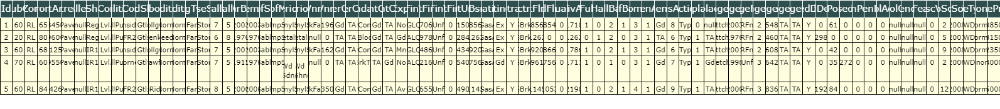

In [7]:
display(Markdown(""" <span style="color:darkgreen; font-style:italic; font-size:15px">  <b>First few rows of the dataset is shown below   </b></span>"""))
vis_data(data.head())

### Formatting

In [74]:
original_cols = data.columns
cols_vis = ' || '.join(original_cols)
print(colored("\nColumn Names (Before Formatting):", 'magenta', attrs = ['bold']),"\n{}".format(cols_vis))

#List of special characters that should not be present
special_chars = r'[?|$|#|@|%|*|(|)|<|>|:|"|{|}|,|.|;|!|^|\|]'

#Lower case and remove white spaces
data.columns = list(map(lambda x:re.sub(special_chars,r'',x.lower().replace(' ','_').replace("'","").replace("|","_")), data.columns))

updated_cols = data.columns
cols_vis = ' || '.join(updated_cols)
print(colored("\nColumn Names (After Formatting):", 'blue', attrs = ['bold']), "\n{}".format(cols_vis))


Column Names (Before Formatting): 
Id || MSSubClass || MSZoning || LotFrontage || LotArea || Street || Alley || LotShape || LandContour || Utilities || LotConfig || LandSlope || Neighborhood || Condition1 || Condition2 || BldgType || HouseStyle || OverallQual || OverallCond || YearBuilt || YearRemodAdd || RoofStyle || RoofMatl || Exterior1st || Exterior2nd || MasVnrType || MasVnrArea || ExterQual || ExterCond || Foundation || BsmtQual || BsmtCond || BsmtExposure || BsmtFinType1 || BsmtFinSF1 || BsmtFinType2 || BsmtFinSF2 || BsmtUnfSF || TotalBsmtSF || Heating || HeatingQC || CentralAir || Electrical || 1stFlrSF || 2ndFlrSF || LowQualFinSF || GrLivArea || BsmtFullBath || BsmtHalfBath || FullBath || HalfBath || BedroomAbvGr || KitchenAbvGr || KitchenQual || TotRmsAbvGrd || Functional || Fireplaces || FireplaceQu || GarageType || GarageYrBlt || GarageFinish || GarageCars || GarageArea || GarageQual || GarageCond || PavedDrive || WoodDeckSF || OpenPorchSF || EnclosedPorch || 3SsnPorch || 

## Data Summary

In [63]:
display(Markdown(""" <span style="color:darkgreen; font-style:italic; font-size:15px">  <b>Data type of the loaded dataset is shown below   </b></span>"""))
display(data.dtypes)

cols = data.columns
#Getting the list of numerical features
num_cols = data._get_numeric_data().columns.tolist()
num_cols_vis = ' || '.join(num_cols)
print(colored("Numerical columns:\nCount:", 'magenta', attrs=['bold']),"{}\n{}".format(len(num_cols),num_cols_vis))

#Getting list of categorical features
cat_cols = list(set(cols) - set(num_cols))
cat_cols_vis = ' || '.join(cat_cols)
print(colored("Categorical columns:\nCount:", 'magenta', attrs=['bold']),"{}\n{}".format(len(cat_cols),cat_cols_vis))

 <span style="color:darkgreen; font-style:italic; font-size:15px">  <b>Data type of the loaded dataset is shown below   </b></span>

id                 int64
mssubclass         int64
mszoning          object
lotfrontage      float64
lotarea            int64
                  ...   
mosold             int64
yrsold             int64
saletype          object
salecondition     object
saleprice          int64
Length: 81, dtype: object

Numerical columns:
Count: 38
id || mssubclass || lotfrontage || lotarea || overallqual || overallcond || yearbuilt || yearremodadd || masvnrarea || bsmtfinsf1 || bsmtfinsf2 || bsmtunfsf || totalbsmtsf || 1stflrsf || 2ndflrsf || lowqualfinsf || grlivarea || bsmtfullbath || bsmthalfbath || fullbath || halfbath || bedroomabvgr || kitchenabvgr || totrmsabvgrd || fireplaces || garageyrblt || garagecars || garagearea || wooddecksf || openporchsf || enclosedporch || 3ssnporch || screenporch || poolarea || miscval || mosold || yrsold || saleprice
Categorical columns:
Count: 43
bsmtexposure || foundation || street || fence || centralair || garagecond || heating || masvnrtype || electrical || roofmatl || housestyle || miscfeature || mszoning || garagequal || bsmtfintype2 || bsmtqual || neighborhood || bsmtcond || lotconfig || landcontour || kitchenqual || landslope || bsmtfintype1 || extercond || functional || salecondition || exterior2nd || paveddrive || bldgtype || garagefinish || utilities ||

#### Numerical columns summary

###### Getting a summary of numerical columns where we see the averages and other representatives of numerical data to help us with feature pre-processing later

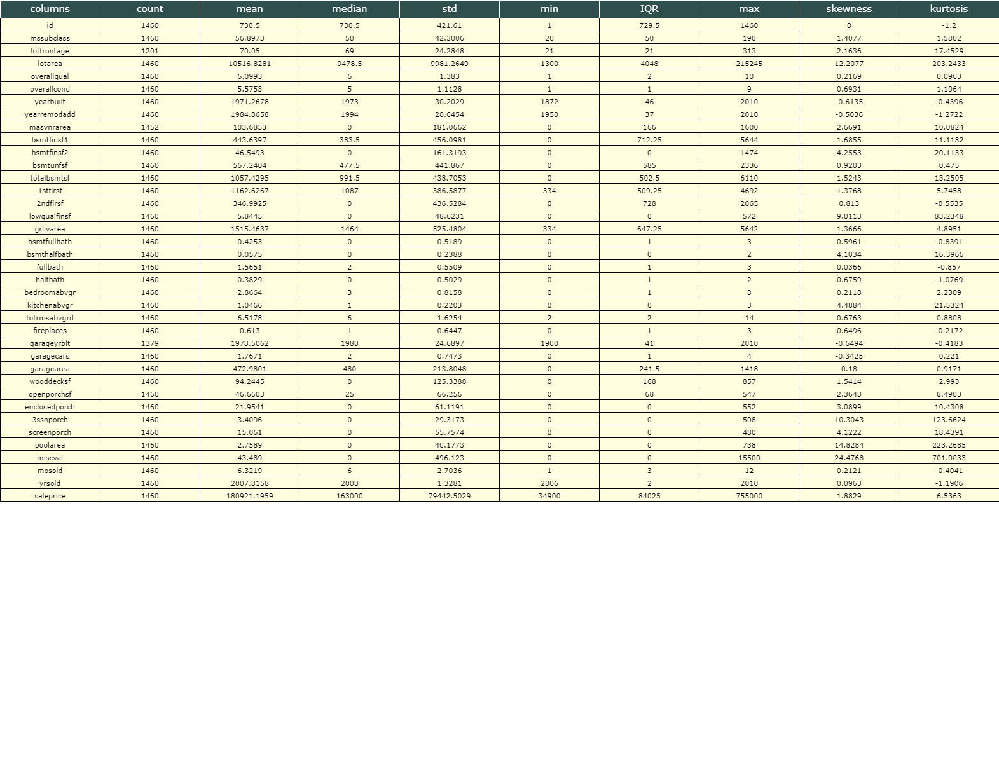

In [64]:
if num_cols == []:
    display(Markdown('__NO NUMERICAL COLUMNS AVAILABLE__'))
else:
    num_desc = data[num_cols].describe().T
    num_desc.insert(loc=5,column='IQR',value = (num_desc['75%']-num_desc['25%']))
    num_desc.drop(['25%','50%','75%'],axis=1,inplace=True)
    
    num_desc['skewness'] = data[num_cols].skew()
    num_desc['kurtosis'] = data[num_cols].kurt()
    num_desc.insert(loc=0, column='columns', value=num_desc.index)
    num_desc.insert(loc=3, column = 'median', value=data[num_cols].median())
    num_desc = num_desc.round(4)
    vis_data(num_desc)


## Numeric features missing value treatment

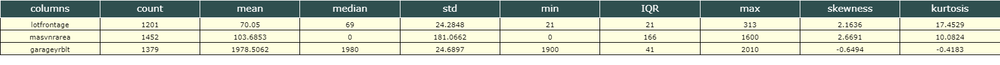

In [75]:
# Filtering out such features with missing data and their important distribution measures

num_desc_mis = num_desc[num_desc['count'] < data.shape[0]]
num_cols_mis = num_desc[num_desc['count'] < data.shape[0]].index.tolist()
vis_data(num_desc_mis)

In [66]:
#Plotting the correlation heatmap to see the dependency of such columns with other columns

corr = (data[num_cols]).corr()
corr.style.background_gradient(cmap='coolwarm')

,id,mssubclass,lotfrontage,lotarea,overallqual,overallcond,yearbuilt,yearremodadd,masvnrarea,bsmtfinsf1,bsmtfinsf2,bsmtunfsf,totalbsmtsf,1stflrsf,2ndflrsf,lowqualfinsf,grlivarea,bsmtfullbath,bsmthalfbath,fullbath,halfbath,bedroomabvgr,kitchenabvgr,totrmsabvgrd,fireplaces,garageyrblt,garagecars,garagearea,wooddecksf,openporchsf,enclosedporch,3ssnporch,screenporch,poolarea,miscval,mosold,yrsold,saleprice
id,1.000000,0.011156,-0.010601,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.050298,-0.005024,-0.005968,-0.007940,-0.015415,0.010496,0.005590,-0.044230,0.008273,0.002289,-0.020155,0.005587,0.006784,0.037719,0.002951,0.027239,-0.019772,0.000072,0.016570,0.017634,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
mssubclass,0.011156,1.000000,-0.386347,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,0.085072,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
lotfrontage,-0.010601,-0.386347,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.038469,0.402797,0.100949,-0.007234,0.198769,0.053532,0.263170,-0.006069,0.352096,0.266639,0.070250,0.285691,0.344997,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
lotarea,-0.033226,-0.139781,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.024947,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
overallqual,-0.028365,0.032628,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.547766,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
overallcond,0.012609,-0.059316,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.324297,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
yearbuilt,-0.012713,0.027850,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.825667,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
yearremodadd,-0.021998,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.642277,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
masvnrarea,-0.050298,0.022936,0.193458,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,-0.072319,0.114442,0.363936,0.344501,0.174561,-0.069071,0.390857,0.085310,0.026673,0.276833,0.201444,0.102821,-0.037610,0.280682,0.249070,0.252691,0.364204,0.373066,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
bsmtfinsf1,-0.005024,-0.069836,0.233633,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.153484,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451

In [ ]:
# #Find numeric columns with missing values having atleast 1 >= 70% correlation with any other feature and drop the feature (Since it is dependent)
# def num_impute(num_cols_mis):
#     data_num_imputed = copy.deepcopy(data)
#     if len(num_cols_mis)!=0:
#         for col in num_cols_mis:
#             if corr[corr[col]>=0.7][col].nunique()!= 1:
#                 data_num_imputed.drop([col], axis=1, inplace=True)
#                 num_cols_mis.remove(col)
    
#     #For remaining mis_num_cols with less than 70% correlation, we will try out multiple cases to treat the missing values
    
#     if len(num_cols_mis)!=0:
#         for col in num_cols_mis:
#             if (data[col].shape[0])/data.shape[0]*100 <= 0.4:
#                 data_num_imputed.drop([col], axis=1, inplace=True)
#             elif ((data[col].shape[0])/data.shape[0]*100) >= 0.4 and ((data[col].shape[0])/data.shape[0]*100) < 0.7:
#                 predictor_vars = list(set(data_num_imputed.columns.tolist())-set(col))
                
#                 # fit regression model using Bayesian Ridge
#                 imputer = IterativeImputer(estimator=BayesianRidge())
#                 # impute missing values
#                 imputed_data = imputer.fit_transform(data[predictor_vars + [col]])
#                 # substitute imputed values for missing values
#                 data_num_imputed[missing_vars] = imputed_data[:, -len([col]):]
#             elif abs(num_desc.filter(items = [col], axis=0)['skewness']).values >= 5:
#                 data_num_imputed[col] = data[col].fillna(data[col].median())
#             elif abs(num_desc.filter(items = [col], axis=0)['skewness']).values < 2:
#                 data_num_imputed[col] = data[col].fillna(data[col].median())
#             else:
#                 data_num_imputed[col] = data[col].fillna(data[col].median())
#             num_cols_mis.remove(col)
            
#     return data_num_imputed            
# # vis_data(num_desc[num_desc['count'] < data.shape[0]])

# # over 70% correlation drop

# # less than 70% correlation
# #     less than 40% available data drop

# #     40-70% available r
# #         regression imputation

# #     above 70% available
# #         if abs(skewness) > 5:
# #             Impute using median
# #         elif abs(kurtosis) < 2:
# #             Impute using median
# #         else:
# #             Impute using mean

#### Categorical columns summary

###### Getting a summary of categorical columns where we see the distribution across different labels of the categorical features to help us with feature pre-processing later

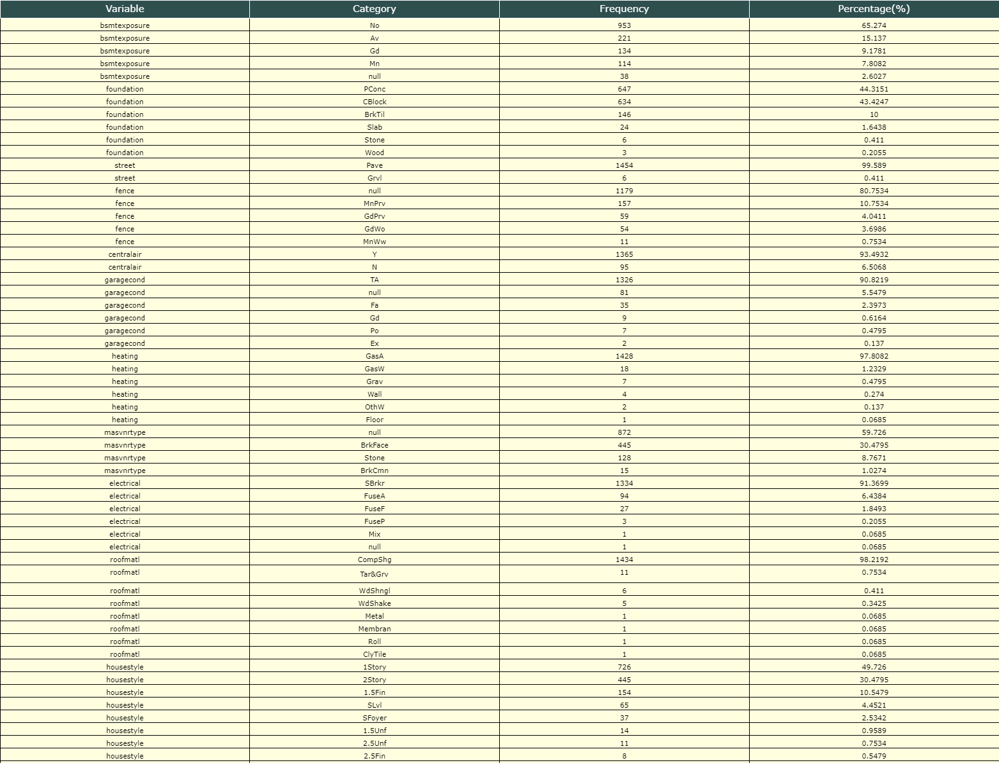

In [67]:
cat_summ = pd.DataFrame(columns=['Variable','Category','Frequency','Percentage(%)'])
for col in cat_cols:
    cat_col_summary = pd.DataFrame(data[col].value_counts(dropna=False)).reset_index()
    cat_col_summary.columns = ['Category','Frequency']
    cat_col_summary['Percentage(%)'] = (cat_col_summary["Frequency"]/cat_col_summary["Frequency"].sum())*100
    cat_col_summary['Variable'] = col
    cat_summ = pd.concat([cat_summ, cat_col_summary],ignore_index = True)
vis_data(cat_summ[['Variable','Category','Frequency','Percentage(%)']].round(4))

In [76]:
# Filtering out such features with missing data and their important distribution measures
cat_cols_mis = []

for col in cat_cols:
    if data[~data[col].isnull()].shape[0] < data.shape[0]:
        cat_cols_mis.append(col)

print(colored("Missing categorical columns are: {}", 'magenta', attrs = ['bold']).format((' || ').join(cat_cols_mis)))

Missing categorical columns are: bsmtexposure || fence || garagecond || masvnrtype || electrical || miscfeature || garagequal || bsmtfintype2 || bsmtqual || bsmtcond || bsmtfintype1 || garagefinish || fireplacequ || garagetype || alley || poolqc


## Categorical missing value treatment

In [77]:
#Find numeric columns with missing values having atleast 1 >= 70% correlation with any other feature and drop the feature (Since it is dependent)
def missing_impute(num_cols_mis,cat_cols_mis):
    data_num_imputed = copy.deepcopy(data)
    if len(num_cols_mis)==0:
        print(colored("There is no numerical column missing any value!", 'magenta', attrs = ['bold']))
    else:
        #Drop numerical columns with missing value but high correlation with 1 or more other numerical features
        drop_num_col = []
        for col in num_cols_mis:
            if corr[corr[col]>=0.7][col].nunique()!= 1:
                print(col)
                data_num_imputed.drop([col], axis=1, inplace=True)
                drop_num_col.append(col)
                num_cols_mis.remove(col)
        print(colored("Numerical columns that were dropped due to high correlation with other independent features: {}", 'magenta', attrs=['bold']).format(' || '.join(drop_num_col)))

    drop_num_col = []
    if len(num_cols_mis)!=0:
        for col in num_cols_mis:
            if round((data[~data[col].isna()]).shape[0]/data.shape[0]*100,2) <= 40:
                print(col)
                data_num_imputed.drop([col], axis=1, inplace=True)
                drop_num_col.append(col)
                print(colored("Numerical columns that were dropped due to high missing value % (>=40%): {}", 'magenta', attrs=['bold']).format(' || '.join(drop_num_col)))
            elif round((data[~data[col].isna()]).shape[0]/data.shape[0]*100,2) >= 80:
                if abs(num_desc.filter(items = [col], axis=0)['skewness']).values >= 5:
                    data_num_imputed[col] = data[col].fillna(data[col].median())
                elif abs(num_desc.filter(items = [col], axis=0)['skewness']).values < 2:
                    data_num_imputed[col] = data[col].fillna(data[col].median())
                else:
                    data_num_imputed[col] = data[col].fillna(data[col].median())
            drop_num_col.append(col)
            num_cols_mis.remove(col)

    if len(cat_cols_mis)==0:
            print(colored("There is no categorical column with any missing value!", 'magenta', attrs = ['bold']))
    else:
        drop_cat_col = []
        remove_cat_cols = list(cat_summ[(cat_summ['Category'].isna()) & (cat_summ['Percentage(%)']>=40)].Variable)
        data_cat_imputed = data_num_imputed.drop(columns=remove_cat_cols, axis=1, inplace=False)
        drop_cat_col.append(remove_cat_cols)
        print(colored("Categorical columns that were dropped due to high missing value % (>=40%): {}", 'magenta', attrs=['bold']).format(' || '.join(remove_cat_cols)))
        cat_cols_mis = list(set(cat_cols_mis) - set(remove_cat_cols))
    
    if len(cat_cols_mis)!=0:
        # cat_impute_mode = list(mis_cat_df[(mis_cat_df['Category'].isna()) & (mis_cat_df['Percentage(%)']<=10)].Variable)
        cat_impute_mode = cat_cols_mis
        
        impute_mode = SimpleImputer(strategy = 'most_frequent')
        cat_mode_impute = impute_mode.fit_transform(data_cat_imputed[cat_impute_mode])
        data_cat_imputed.drop(cat_impute_mode, axis=1, inplace = True)
        df_cat_mode_imputed = pd.DataFrame(cat_mode_impute, columns=cat_impute_mode)
        data_cat_imputed = pd.concat([data_cat_imputed, df_cat_mode_imputed], axis=1)

    if (len(num_cols_mis)!=0):
        print(colored("There are some columns in the datasets which should be imputed using model driven predictive measures. These features are: {}", 'magenta', attrs=['bold']).format((' || ').join((num_cols_mis+cat_cols_mis))))
        print(colored("Using Iterative imputer for the final imputation ...", 'magenta', attrs=['bold']))

        iter_imputer = IterativeImputer(random_state=42)
        iter_imputed = iter_imputer.fit_transform(data_cat_imputed[num_cols_mis])
        df_num_iter_imputed = pd.DataFrame(iter_imputed, columns=num_cols_mis)
        data_cat_imputed.drop(num_cols_mis, axis=1, inplace = True)
        data_cat_imputed = pd.concat([data_cat_imputed, df_num_iter_imputed], axis=1)

    return data_cat_imputed
# vis_data(num_desc[num_desc['count'] < data.shape[0]])

# over 70% correlation drop

# less than 70% correlation
#     less than 40% available data drop

#     40-70% available r
#         regression imputation

#     above 70% available
#         if abs(skewness) > 5:
#             Impute using median
#         elif abs(kurtosis) < 2:
#             Impute using median
#         else:
#             Impute using mean

In [81]:
data_imputed = missing_impute(num_cols_mis, cat_cols_mis)
data_imputed.head()

garageyrblt
Numerical columns that were dropped due to high correlation with other independent features: garageyrblt
Categorical columns that were dropped due to high missing value % (>=40%): fence || masvnrtype || miscfeature || fireplacequ || alley || poolqc
There are some columns in the datasets which should be imputed using model driven predictive measures. These features are: masvnrarea || bsmtexposure || bsmtfintype2 || garagequal || bsmtqual || bsmtcond || garagecond || garagefinish || bsmtfintype1 || electrical || garagetype
Using Iterative imputer for the final imputation ...


,id,mssubclass,mszoning,lotfrontage,lotarea,street,lotshape,landcontour,utilities,lotconfig,...,bsmtfintype2,garagequal,bsmtqual,bsmtcond,garagecond,garagefinish,bsmtfintype1,electrical,garagetype,masvnrarea
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,...,Unf,TA,Gd,TA,TA,RFn,GLQ,SBrkr,Attchd,196.0
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,...,Unf,TA,Gd,TA,TA,RFn,ALQ,SBrkr,Attchd,0.0
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,...,Unf,TA,Gd,TA,TA,RFn,GLQ,SBrkr,Attchd,162.0
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,...,Unf,TA,TA,Gd,TA,Unf,ALQ,SBrkr,Detchd,0.0
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,...,Unf,TA,Gd,TA,TA,RFn,GLQ,SBrkr,Attchd,350.0


In [ ]:
# def cat_impute(cat_mis):
#     mis_cat_df = cat_summ[cat_summ['Variable'].isin(cat_mis)]
    
#     if len(cat_mis)==0:
#         print(colored("There are no categorical columns with missing values!", 'magenta', attrs = ['bold']))
#     else:
#         remove_cat_cols = list(mis_cat_df[(mis_cat_df['Category'].isna()) & (mis_cat_df['Percentage(%)']>=40)].Variable)
#         data_cat_imputed = data_num_imputed.drop(columns=remove_cat_cols, axis=1, inplace=False)
#         cat_mis = list(set(cat_mis) - set(remove_cat_cols))
    
#     if len(cat_mis)!=0:
#         cat_impute_mode = list(mis_cat_df[(mis_cat_df['Category'].isna()) & (mis_cat_df['Percentage(%)']<=10)].Variable)
        
#         impute_mode = SimpleImputer(strategy = 'most_frequent')
#         impute_mode.fit(data_cat_imputed[cat_impute_mode])
    
#         data_cat_imputed[cat_impute_mode] = impute_mode.transform(data_cat_imputed[cat_impute_mode])
#         cat_mis = list(set(cat_mis) - set(cat_impute_mode))
    
#     print(colored("Categorical missing value treatment is complete!", 'magenta', attrs = ['bold']))
#     return(data_cat_imputed)
#     # if len(cat_mis)!=0:
        
#     #     for col in list(mis_cat_df[(mis_cat_df['Category'].isna()) & (mis_cat_df['Percentage(%)']>=40)].Variable):
#     #         predictor_vars = list(set(data_num_imputed.columns.tolist())-set(col))

In [87]:
#Update num and cat cols
num_cols_imputed = data_imputed._get_numeric_data().columns.tolist()
cat_cols_imputed = list(set(data_imputed.columns.tolist()) - set(num_cols_imputed))

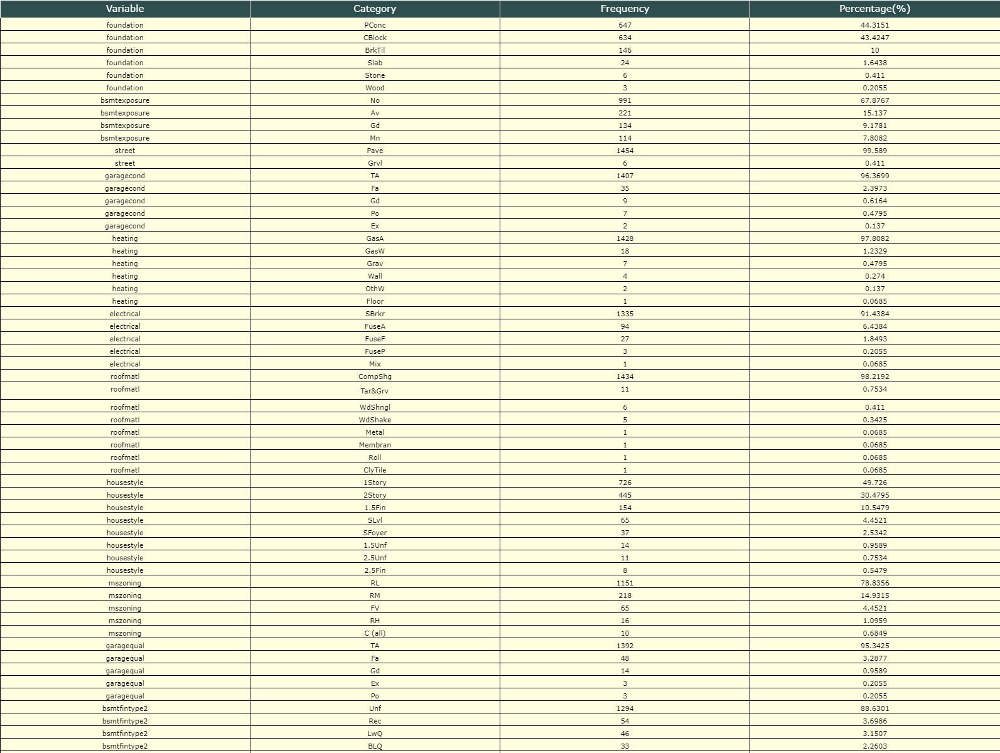

In [88]:
cat_summ_imputed = pd.DataFrame(columns=['Variable','Category','Frequency','Percentage(%)'])
for col in cat_cols_imputed:
    cat_col_summary_imputed = pd.DataFrame(data_imputed[col].value_counts(dropna=False)).reset_index()
    cat_col_summary_imputed.columns = ['Category','Frequency']
    cat_col_summary_imputed['Percentage(%)'] = (cat_col_summary_imputed["Frequency"]/cat_col_summary_imputed["Frequency"].sum())*100
    cat_col_summary_imputed['Variable'] = col
    cat_summ_imputed = pd.concat([cat_summ_imputed, cat_col_summary_imputed],ignore_index = True)
vis_data(cat_summ_imputed[['Variable','Category','Frequency','Percentage(%)']].round(4))

In [89]:
min_cat = cat_summ_imputed.groupby('Variable').aggregate('min').reset_index()
max_cat = cat_summ_imputed.groupby('Variable').aggregate('max').reset_index()

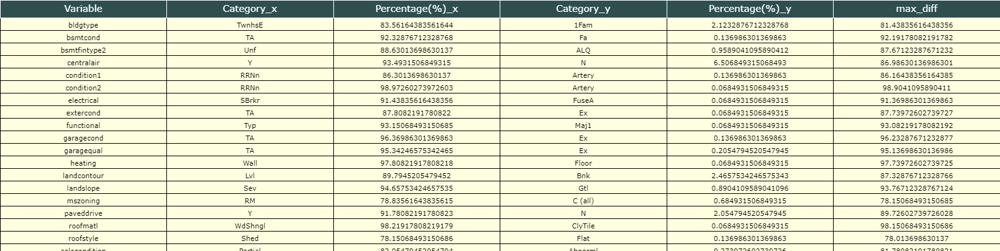

In [90]:
min_max_cat = max_cat.merge(min_cat, on = 'Variable', how='left')
min_max_cat.drop(['Frequency_x','Frequency_y'], axis=1, inplace=True)
min_max_cat['max_diff'] = (min_max_cat['Percentage(%)_x']-min_max_cat['Percentage(%)_y']).abs()
min_max_cat.head()
min_max_cat.drop(min_max_cat[min_max_cat.max_diff <= 75].index, inplace=True)
vis_data(min_max_cat)

In [91]:
#Removing categorical columns with high (>75%) distribution imbalance
print("Before removing categorical features with high distribution imbalance:", data_imputed.shape)
data_imputed.drop(min_max_cat.Variable.unique().tolist(), axis=1, inplace = True)
cat_cols_imputed = list(set(cat_cols_imputed) - set(min_max_cat.Variable.unique().tolist()))
print("After removing categorical features with high distribution imbalance:", data_imputed.shape)

Before removing categorical features with high distribution imbalance: (1460, 74)
After removing categorical features with high distribution imbalance: (1460, 52)


In [92]:
#User input to set the identifiers and target flag
identifier = 'id'
target = 'saleprice'

##### Filtering for independent categorical coumns

In [93]:
#Filtering for independent cat_cols

ind_cat_cols = list(set(cat_cols_imputed) - set([identifier]) - set([target]))

In [94]:
#Finding categorical features with two labels

cat_cols_OHE = list(set(cat_cols_imputed).intersection(list(data_imputed.columns[data_imputed.nunique()==2])))
cat_cols_LE = list(set(ind_cat_cols).intersection(list(set(ind_cat_cols)-set(cat_cols_OHE))))

##### Categorical data cannot be passed directly through a classifier (although a decision tree based classifier can still give an estimate but better to encode and change them into numerical features)

##### As a rule of thumb, using one hot encoding for categorical variables with 2 labels and label encoding for rest of the categorical features with more than 2 labels (to avoid the curse of dimensionality)
##### One hot encoding also comes with a possibility of dummy data curse, since a label False is nothing but Not True and hence says the same information as the True flag. Keeping both in the data will increase collinearity. Hence such cases are removed from the data hile performing one hot encoding

In [95]:
if len(cat_cols_OHE) == 0:
    print(colored("No categorical columns for One hot encoding!", 'magenta', attrs = ['bold']))
else:
    dummy_data_2_label = pd.get_dummies(data_imputed[(cat_cols_OHE+identifier)], columns = ind_cat_cols_2_label, drop_first=True, dtype = np.int64)
    dummy_data_2_label.head()

No categorical columns for One hot encoding!


In [96]:
if len(cat_cols_LE) == 0:
    print(colored("No categorical columns for Label encoding!", 'magenta', attrs = ['bold']))
else:
    le = LabelEncoder()
    le_data = pd.DataFrame()
    for i in cat_cols_LE:
        le_data[i] = le.fit_transform(data_imputed[i])
    le_data['id'] = data_imputed['id']

In [97]:
#Final encoded data (Excluding target variable)

data_enc = pd.DataFrame()
keep = num_cols_imputed
data_enc = data_imputed[keep]
data_enc = data_enc.merge(le_data, how='left', on='id')
data_enc.shape

(1460, 52)

## Outlier treatment

<span style="color:darkblue; font-style: bold; font-size:10px"> Kernel Density Estimation plots for numerical features!</span>

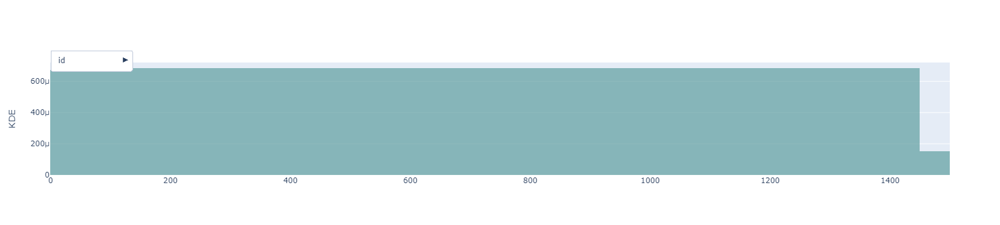

In [57]:
KDE(data_enc)

# Data Preparation

### Train-Validation-Test Split

##### Validation set is usuaaly the set on the basis of which multiple iterations are run in order to get at the best model/parameters. Test set is the set on which final performance measyrement is done

In [30]:
# #Train-Validation-test split
# split_perc = 0.20
# X = data_enc[list(set(list(data_enc.columns)) - set([target]) - set([identifier]))]
# Y = data_enc[target]

# X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = split_perc, random_state = 41)

# print(colored("\nTrain-validation-test split has been performed\n", 'green', attrs = ['bold']))
# print(colored("\nTraining-Test split percentage:", 'magenta', attrs = ['bold']), colored("\t{}:{} (%)", 'blue', attrs = ['bold']).format(int((1-split_perc)*100), int(split_perc*100)))
# print(colored("\nTotal Observations:", 'magenta', attrs = ['bold']), colored("\t{} ", 'blue', attrs=['bold']).format(X.shape[0]))
# print(colored("\nTotal Independent Features:", 'magenta', attrs = ['bold']), colored("\t{} ", 'blue', attrs=['bold']).format(X.shape[1]))
# print(colored("\Training Observations:", 'magenta', attrs = ['bold']), colored("\t{} ", 'blue', attrs=['bold']).format(X_train.shape[0]))
# print(colored("\nTest Observations:", 'magenta', attrs = ['bold']), colored("\t{} ", 'blue', attrs=['bold']).format(X_test.shape[0]))

In [98]:
X_train = data_enc.loc[:, data_enc.columns != "saleprice"]
Y_train = data_enc['saleprice']

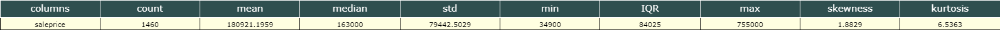

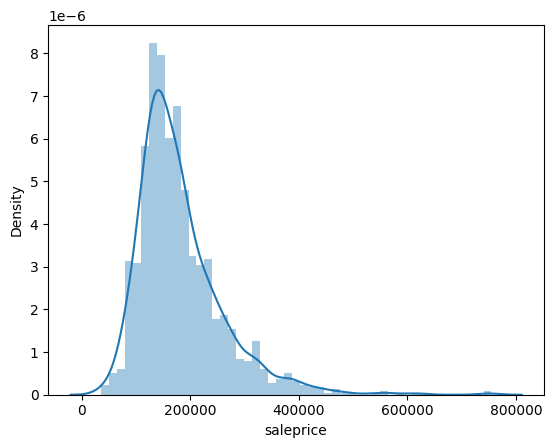

In [99]:
# Checking distribution of dependent variable

#PLot Histogram for 'SalePrice'
sns.distplot(data_enc['saleprice'])


num_desc_dep = pd.DataFrame(data_enc.describe().T)
num_desc_dep.insert(loc=5,column='IQR',value = (num_desc_dep['75%']-num_desc_dep['25%']))
num_desc_dep.drop(['25%','50%','75%'],axis=1,inplace=True)

num_desc_dep['skewness'] = data[num_cols].skew()
num_desc_dep['kurtosis'] = data[num_cols].kurt()
num_desc_dep.insert(loc=0, column='columns', value=num_desc_dep.index)
num_desc_dep.insert(loc=3, column = 'median', value=data_enc['saleprice'].median())
num_desc_dep = num_desc_dep.round(4)
vis_data(num_desc_dep[num_desc_dep['columns'] == 'saleprice'])


Skewness : 0.121335
Kurtosis : 0.809532


<Axes: xlabel='saleprice', ylabel='Density'>

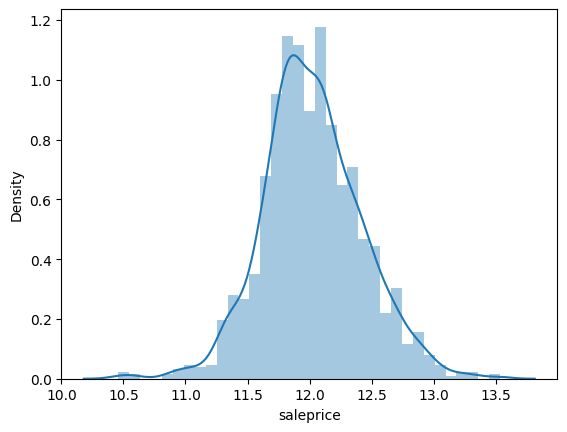

In [100]:
#Since it has high skewness and kurtosis too, adding a log transformation

Y_train = np.log(Y_train)
print("Skewness : %f" % Y_train.skew())
print("Kurtosis : %f" % Y_train.kurt())
sns.distplot(Y_train)

## Standard Scaling

In [101]:
scaler = StandardScaler()
# transform data
X_train_id = X_train['id']
X_train = pd.DataFrame(scaler.fit_transform(X_train.loc[:,X_train.columns != 'id']), columns = X_train.loc[:,X_train.columns != 'id'].columns.tolist())
X_train['id'] = X_train_id
X_train.head()

,mssubclass,lotfrontage,lotarea,overallqual,overallcond,yearbuilt,yearremodadd,bsmtfinsf1,bsmtfinsf2,bsmtunfsf,...,heatingqc,bsmtfintype1,garagetype,housestyle,exterior1st,kitchenqual,lotshape,exterqual,exterior2nd,id
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.575425,-0.288653,-0.944591,...,-0.884658,-0.429918,-0.686776,1.026689,0.743092,-0.409369,0.750731,-0.777976,0.751626,1
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,1.171992,-0.288653,-0.641228,...,-0.884658,-1.518697,-0.686776,-0.543457,-0.508251,0.795629,0.750731,0.663451,-0.661060,2
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.092907,-0.288653,-0.301643,...,-0.884658,-0.429918,-0.686776,1.026689,0.743092,-0.409369,-1.378933,-0.777976,0.751626,3
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.499274,-0.288653,-0.061670,...,0.265476,-1.518697,1.586905,1.026689,1.055928,-0.409369,-1.378933,0.663451,1.316701,4
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,0.463568,-0.288653,-0.174865,...,-0.884658,-0.429918,-0.686776,1.026689,0.743092,-0.409369,-1.378933,-0.777976,0.751626,5


<span style="color:darkblue; font-style: bold; font-size:10px"> Kernel Density Estimation plots for numerical features!</span>

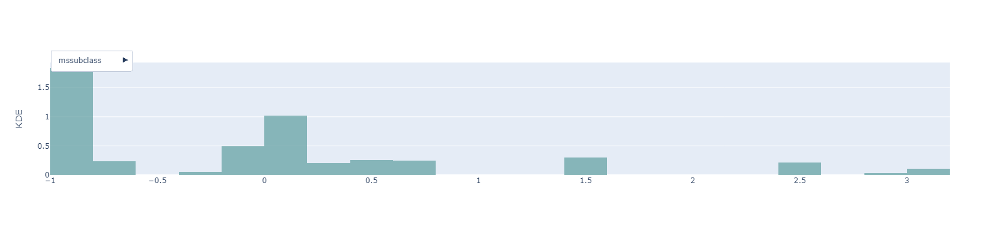

In [54]:
KDE(X_train)

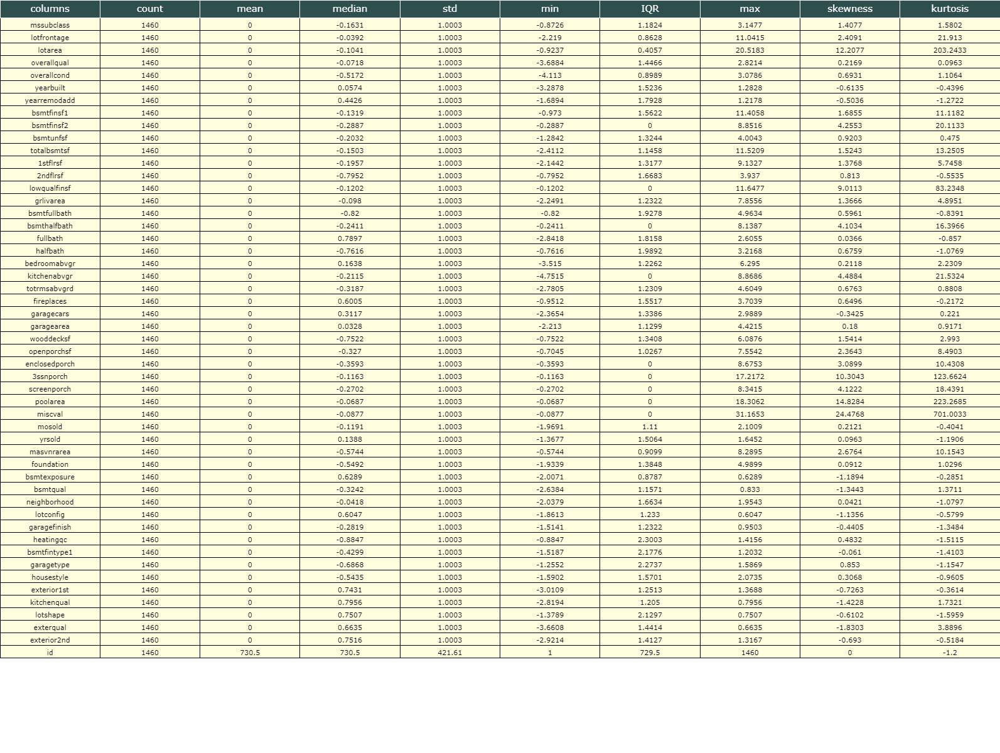

In [102]:
# Checking distribution of independent variables post standardization

num_desc_train = pd.DataFrame(X_train.describe().T)
num_desc_train.insert(loc=5,column='IQR',value = (num_desc_train['75%']-num_desc_train['25%']))
num_desc_train.drop(['25%','50%','75%'],axis=1,inplace=True)

num_desc_train['skewness'] = X_train[X_train.columns.tolist()].skew()
num_desc_train['kurtosis'] = X_train[X_train.columns.tolist()].kurt()
num_desc_train.insert(loc=0, column='columns', value=num_desc_train.index)
num_desc_train.insert(loc=3, column = 'median', value=X_train.median())
num_desc_train = num_desc_train.round(4)
vis_data(num_desc_train)


In [103]:
# Detect overall outliers using zscore > 3 method
outliers = X_train[(np.abs(zscore(X_train)) > 3).all(axis=1)]
if len(outliers) ==0:
    print(colored("No overall level outliers. Moving to Cook's outlier treatment as it is a regression problem ..:", 'magenta', attrs = ['bold']))
else:
    X_train = X_train[(np.abs(zscore(X_train)) <= 3).all(axis=1)]

No overall level outliers. Moving to Cook's outlier treatment as it is a regression problem ..:


In [104]:
Y_train = Y_train.values.reshape(-1,1)

In [105]:
X_cooks = sm.add_constant(X_train)

# fit the model
model = sm.OLS(Y_train, X_cooks).fit()

np.set_printoptions(suppress=True)

# create instance of influence
influence = model.get_influence()

# get Cook's distance for each observation
cooks_distances = influence.cooks_distance

# print Cook's distances
print(cooks_distances)

(array([0.00000482, 0.00063742, 0.00000478, ..., 0.00234081, 0.00043666,
       0.00000653]), array([1., 1., 1., ..., 1., 1., 1.]))


In [106]:
summary_cooks = influence.summary_frame()
summary_cooks.head()

,dfb_const,dfb_mssubclass,dfb_lotfrontage,dfb_lotarea,dfb_overallqual,dfb_overallcond,dfb_yearbuilt,dfb_yearremodadd,dfb_bsmtfinsf1,dfb_bsmtfinsf2,...,dfb_lotshape,dfb_exterqual,dfb_exterior2nd,dfb_id,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.006787,-0.002449,-0.001214,0.000876,0.001601,-0.000862,0.000445,-0.000048,0.000637,-0.000390,...,0.002455,-0.001731,0.000359,-0.005936,0.000005,0.124848,0.015829,0.015833,0.124804,0.015828
1,-0.050133,0.015307,-0.010751,0.020286,0.011641,-0.061695,-0.014316,0.045960,-0.025704,0.015568,...,-0.040460,-0.007168,0.005833,0.043320,0.000637,-0.947123,0.035633,-0.182060,-0.947089,-0.182053
2,0.006585,-0.002473,-0.001028,0.000144,0.000402,-0.001181,-0.001122,0.000622,-0.002815,-0.000914,...,-0.004392,-0.002117,0.000204,-0.005719,0.000005,0.123784,0.015952,0.015760,0.123740,0.015755
3,-0.071281,0.010568,0.032185,0.002711,-0.072925,0.082068,0.036094,-0.013889,0.067199,0.032993,...,0.062821,-0.013202,-0.017984,0.060064,0.002087,-1.436630,0.049958,-0.329441,-1.437172,-0.329566
4,-0.080617,-0.001413,0.004138,0.009631,-0.014067,0.020635,0.016605,-0.000246,0.012897,0.010831,...,0.036726,0.003579,-0.008019,0.070914,0.000758,-1.452252,0.018342,-0.198514,-1.452824,-0.198592


In [107]:
cooks_remove = summary_cooks.loc[:,'cooks_d'] > 3*summary_cooks['cooks_d'].mean()
cooks_indices_to_drop = cooks_remove[cooks_remove].index

In [108]:
print(colored("Before dropping indexes with high cook's distance -> large outliers, shape of X_train: {}", 'magenta', attrs = ['bold']).format(X_train.shape))
X_train.drop(index=list(cooks_indices_to_drop), axis=0, inplace=True)
print(colored("After dropping indexes with high cook's distance -> large outliers, shape of X_train: {}", 'magenta', attrs = ['bold']).format(X_train.shape))

Before dropping indexes with high cook's distance -> large outliers, shape of X_train: (1460, 51)
After dropping indexes with high cook's distance -> large outliers, shape of X_train: (1439, 51)


In [117]:
# Y_train = pd.DataFrame(Y_train, columns=['saleprice'])
print(colored("Before dropping indexes with high cook's distance -> large outliers, shape of Y_train: {}", 'magenta', attrs = ['bold']).format(Y_train.shape))
Y_train.drop(index=list(cooks_indices_to_drop), axis=0, inplace=True)
print(colored("After dropping indexes with high cook's distance -> large outliers, shape of Y_train: {}", 'magenta', attrs = ['bold']).format(Y_train.shape))

Before dropping indexes with high cook's distance -> large outliers, shape of Y_train: (1460, 1)
After dropping indexes with high cook's distance -> large outliers, shape of Y_train: (1439, 1)


# Feature Engineering

In [89]:
print(X_train.columns.tolist())



['2ndflrsf', 'yearbuilt', 'foundation', 'fireplaces', 'lotfrontage', 'mssubclass', 'mosold', 'halfbath', 'bsmthalfbath', 'bedroomabvgr', 'overallqual', 'openporchsf', 'garagefinish', 'exterior2nd', 'yearremodadd', 'bsmtfinsf2', 'neighborhood', 'exterior1st', 'housestyle', 'bsmtfintype1', 'yrsold', 'masvnrarea', 'bsmtqual', 'grlivarea', 'garagearea', 'lotconfig', 'screenporch', '3ssnporch', 'wooddecksf', 'lotarea', 'fullbath', 'enclosedporch', 'garagecars', '1stflrsf', 'heatingqc', 'miscval', 'poolarea', 'kitchenqual', 'bsmtfinsf1', 'kitchenabvgr', 'bsmtunfsf', 'overallcond', 'lotshape', 'totrmsabvgrd', 'bsmtfullbath', 'bsmtexposure', 'lowqualfinsf', 'exterqual', 'totalbsmtsf', 'garagetype']


### Removing linear dependency between independent variables

##### Variance inflation factor is used to capture the linear dependency of independent factors on each other. A high VIF value implies the feature has dependency with more features/higher dependency with some features. The calculation is insipired by R-square value post regression line fit and hence the formula for VIF = 1/(1-R**2)

In [118]:
#Linear dependency through VIF

X_train_processed = copy.deepcopy(X_train)
exog_df = add_constant(X_train_processed)
vifs = pd.Series([1/(1. - OLS(exog_df[col].values,
                              exog_df.loc[:, exog_df.columns!=col].values).fit().rsquared) for col in exog_df],
                 index = exog_df.columns,
                 name = 'VIF')
vifs = pd.DataFrame(vifs)
vifs.drop('const', axis = 0, inplace = True)
vifs = vifs['VIF'].where(vifs['VIF'] <= 15, 15)
vifs = pd.DataFrame(vifs)
vifs = vifs.sort_values(by=['VIF'],ascending = True)

##### Dropping the collinear features from the dataset

In [119]:
multicorr_vars = vifs['VIF'].loc[lambda X: X>=10].index.tolist()
multicorr_vars = list(set(multicorr_vars) - {'bsmtfinsf1', '1stflrsf', 'totalbsmtsf','grlivarea'})     #User input post inspection
X_train_processed.drop(multicorr_vars, axis =1, inplace = True)

#### Variability check

##### COnstant/Quasi-constant variables OR variables with close to 0 standard deviation usually do not show enough variation to give any useful insights into the effect on the response variable. Hence its preferred to have more standard deviation for features, upto an extent, provided no normalization of the data has been perfoemed

In [120]:
def variability_check(df):
    df_desc = df.describe().loc['std'] == 0
    return df_desc[df_desc].index.tolist()

In [121]:
selected_features =[]
selected_features_dict = {}
col_drop = []

zero_variance = variability_check(X_train_processed)
if len(zero_variance) == 0:
    print(colored("\nNo quasi-constant features/no column with 0 std dev", "green", attrs = ['bold']))
else:
    display(Markdown('<span style = "color:darkred"><br><b>QUASI_CONSTANT FEATURES'))
    display(pd.DataFrame(zero_variance, columns = ["Features"]))
print(colored("Standard Deviation of the data:", 'magenta', attrs = ['bold']))
display(pd.DataFrame(X_train_processed.describe().loc['std'].round(4)))


No quasi-constant features/no column with 0 std dev
Standard Deviation of the data:


,std
mssubclass,0.9942
lotfrontage,0.9441
lotarea,0.9058
overallqual,0.9883
overallcond,1.0010
yearbuilt,0.9989
yearremodadd,0.9976
bsmtfinsf1,0.9436
totalbsmtsf,0.9415
1stflrsf,0.9573


# Feature Importance/Selection

## XGBoost Classifier

##### Inclination towards tree based classifiers provided the dataset being categorically heavy

In [142]:
selected_features_dict = {}
# np.percentile(df_xgb['Importance'], 20)
# df_xgb
# df_xgb[df_xgb['Importance'] <= np.percentile(df_xgb['Importance'], 20) ]['Features']

In [143]:
from lightgbm import LGBMRegressor

def LGBM_feature_importance(X_train, Y_train):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    # feature_importances = np.zeros(X.shape[1])

    # Create the model with several hyperparameters
    model_LGBM = LGBMRegressor(objective='regression')
    params_LGBM = {
                  'num_leaves':[3,4],
                  'learning_rate':[0.01,0.05], 
                  'n_estimators':[750,1000,1250],
                  'max_bin':[70,75,80]
                  # 'bagging_fraction':[0.7,0.8,0.85],
                  # 'bagging_freq':[8,9,10]
            }
    
    # Fit the model multiple times to avoid overfitting - Using GridSearchCV method

    grid_LGBM = GridSearchCV(estimator=model_LGBM, param_grid = params_LGBM, cv = 2, n_jobs=-1)
    grid_LGBM.fit(X_train, Y_train)

    print(" Results from Grid Search " )
    print("\n The best estimator across ALL searched params:\n",grid_LGBM.best_estimator_)
    print("\n The best score across ALL searched params:\n",grid_LGBM.best_score_)
    print("\n The best parameters across ALL searched params:\n",grid_LGBM.best_params_)
    # Record the feature importances
    
    Feature_Imp_LGBM = pd.DataFrame({'feature': list(X_train.columns), 
                            'importance': np.round(grid_LGBM.best_estimator_.feature_importances_,4)}).sort_values('importance', 
                                                                            ascending = False)

    vis_data(Feature_Imp_LGBM)
    # Find the features with zero importance
    zero_features_LGBM = list(Feature_Imp_LGBM[Feature_Imp_LGBM['importance'] == 0.0]['feature'])
    print('\nThere are %d features with 0.0 importance' % len(zero_features_LGBM))

    print(colored("Adding all the features in the top 90% importance layer", 'magenta', attrs = ['bold']))
    selected_features_dict.update({"LGBM": Feature_Imp_LGBM[Feature_Imp_LGBM['importance'] > np.percentile(Feature_Imp_LGBM['importance'], 20) ]['feature'].tolist()})
    # return zero_features, feature_importances

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1593
[LightGBM] [Info] Number of data points in the train set: 1439, number of used features: 50
[LightGBM] [Info] Start training from score 12.028849
 Results from Grid Search 

 The best estimator across ALL searched params:
 LGBMRegressor(learning_rate=0.05, max_bin=80, n_estimators=1250, num_leaves=3,
              objective='regression')

 The best score across ALL searched params:
 0.9142327347297201

 The best parameters across ALL searched params:
 {'learning_rate': 0.05, 'max_bin': 80, 'n_estimators': 1250, 'num_leaves': 3}


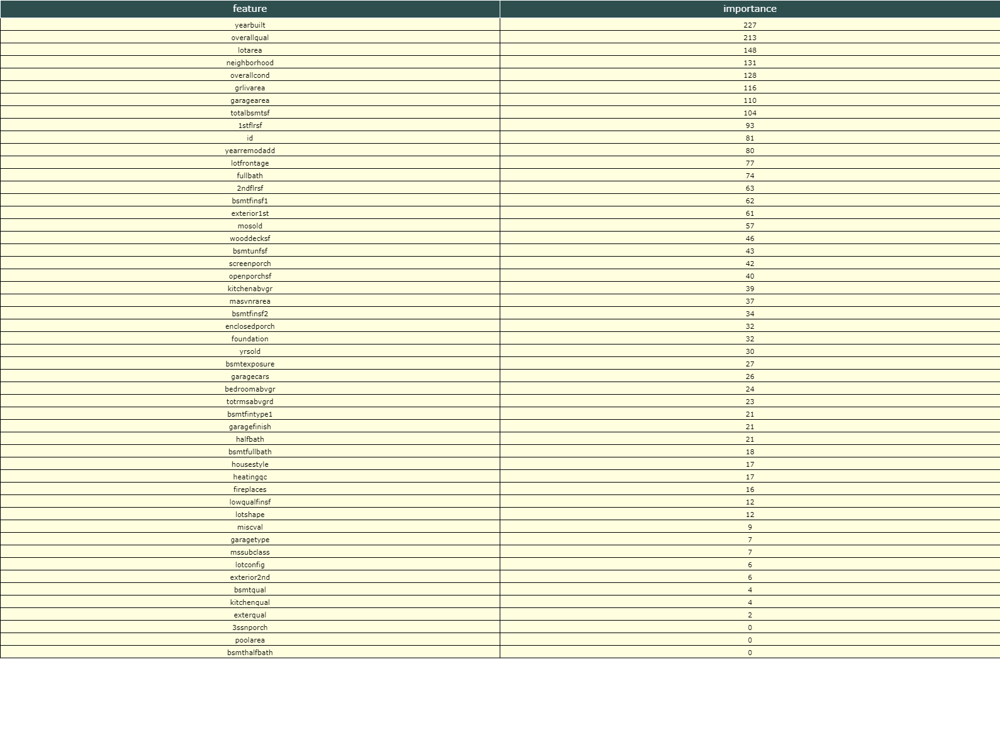


There are 3 features with 0.0 importance
Adding all the features in the top 90% importance layer


In [144]:
LGBM_feature_importance(X_train, Y_train)

In [154]:
def XGB_feature_importance(X_train, Y_train):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    # feature_importances = np.zeros(X.shape[1])

    # Create the model with several hyperparameters
    model_XGB = XGBRegressor()
    params_XGB = {'learning_rate':[0.15,0.10,0.05],
                      'max_depth':[2,3,4,5],
                      'gamma':[0.0,0.1,0.2,0.3]}
    
    # Fit the model multiple times to avoid overfitting - Using GridSearchCV method

    grid_XGB = GridSearchCV(estimator=model_XGB, param_grid = params_XGB, cv = 2, n_jobs=-1)
    grid_XGB.fit(X_train, Y_train)

    print(" Results from Grid Search " )
    print("\n The best estimator across ALL searched params:\n",grid_XGB.best_estimator_)
    print("\n The best score across ALL searched params:\n",grid_XGB.best_score_)
    print("\n The best parameters across ALL searched params:\n",grid_XGB.best_params_)
    # Record the feature importances
    
    Feature_Imp_XGB = pd.DataFrame({'feature': list(X_train.columns), 
                            'importance': np.round(grid_XGB.best_estimator_.feature_importances_,4)}).sort_values('importance', 
                                                                            ascending = False)

    vis_data(Feature_Imp_XGB)
    # Find the features with zero importance
    zero_feature_XGB = list(Feature_Imp_XGB[Feature_Imp_XGB['importance'] == 0.0]['feature'])
    print('\nThere are %d features with 0.0 importance' % len(zero_feature_XGB))

    print(colored("Adding all the features in the top 80% importance layer", 'magenta', attrs = ['bold']))
    selected_features_dict.update({"XGB": Feature_Imp_XGB[Feature_Imp_XGB['importance'] > np.percentile(Feature_Imp_XGB['importance'], 20) ]['feature'].tolist()})
    # return zero_features, feature_importances

 Results from Grid Search 

 The best estimator across ALL searched params:
 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

 The best score across ALL searched params:
 0.9035682366297089

 The best parameters across ALL searched params:
 {'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 3}


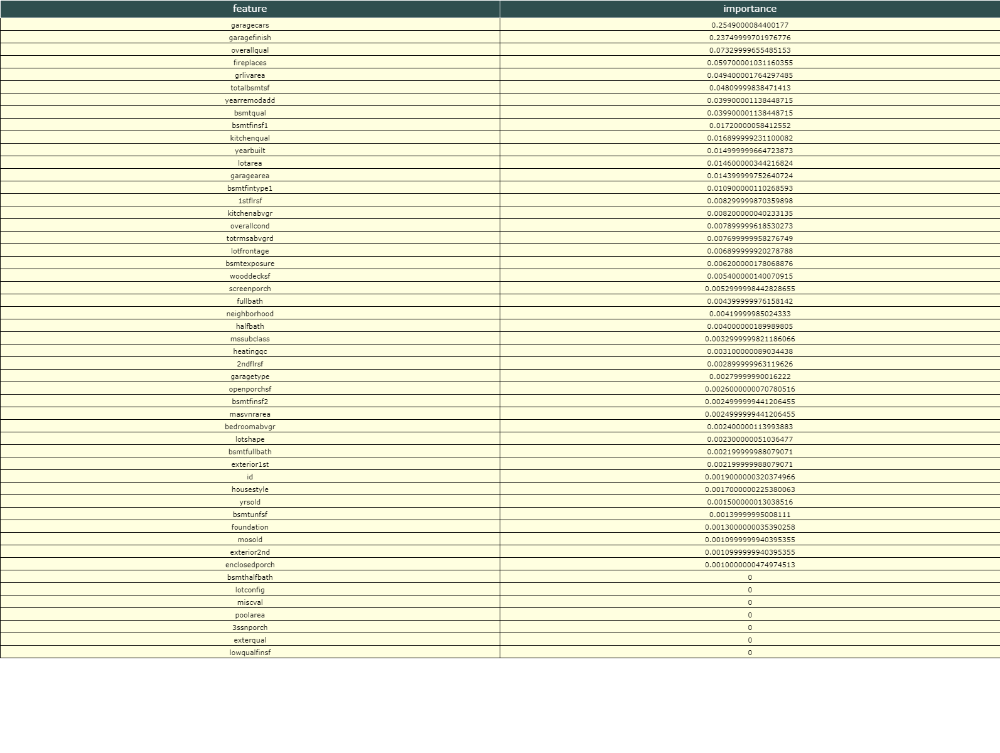


There are 7 features with 0.0 importance
Adding all the features in the top 80% importance layer


In [155]:
XGB_feature_importance(X_train, Y_train)

In [157]:
def RF_feature_importance(X_train, Y_train):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    # feature_importances = np.zeros(X.shape[1])

    # Create the model with several hyperparameters
    model_RF = RandomForestRegressor(random_state=0)
    params_RF = {'n_estimators':[100,200,300],
                  'max_depth':[2,3,4,5],
                  'min_samples_split':[3,4,5,6,7],
                  'min_samples_leaf':[1,2,3]}
    
    # Fit the model multiple times to avoid overfitting - Using GridSearchCV method

    grid_RF = GridSearchCV(estimator=model_RF, param_grid = params_RF, cv = 2, n_jobs=-1)
    grid_RF.fit(X_train, Y_train)

    print(" Results from Grid Search " )
    print("\n The best estimator across ALL searched params:\n",grid_RF.best_estimator_)
    print("\n The best score across ALL searched params:\n",grid_RF.best_score_)
    print("\n The best parameters across ALL searched params:\n",grid_RF.best_params_)
    # Record the feature importances
    
    Feature_Imp_RF = pd.DataFrame({'feature': list(X_train.columns), 
                            'importance': np.round(grid_RF.best_estimator_.feature_importances_,4)}).sort_values('importance', 
                                                                            ascending = False)

    vis_data(Feature_Imp_RF)
    # Find the features with zero importance
    zero_feature_RF = list(Feature_Imp_RF[Feature_Imp_RF['importance'] == 0.0]['feature'])
    print('\nThere are %d features with 0.0 importance' % len(zero_feature_RF))

    print(colored("Adding all the features in the top 80% importance layer", 'magenta', attrs = ['bold']))
    selected_features_dict.update({"RF": Feature_Imp_RF[Feature_Imp_RF['importance'] > np.percentile(Feature_Imp_RF['importance'], 20) ]['feature'].tolist()})
    # return zero_features, feature_importances

 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=3,
                      n_estimators=300, random_state=0)

 The best score across ALL searched params:
 0.8559563355262451

 The best parameters across ALL searched params:
 {'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 300}


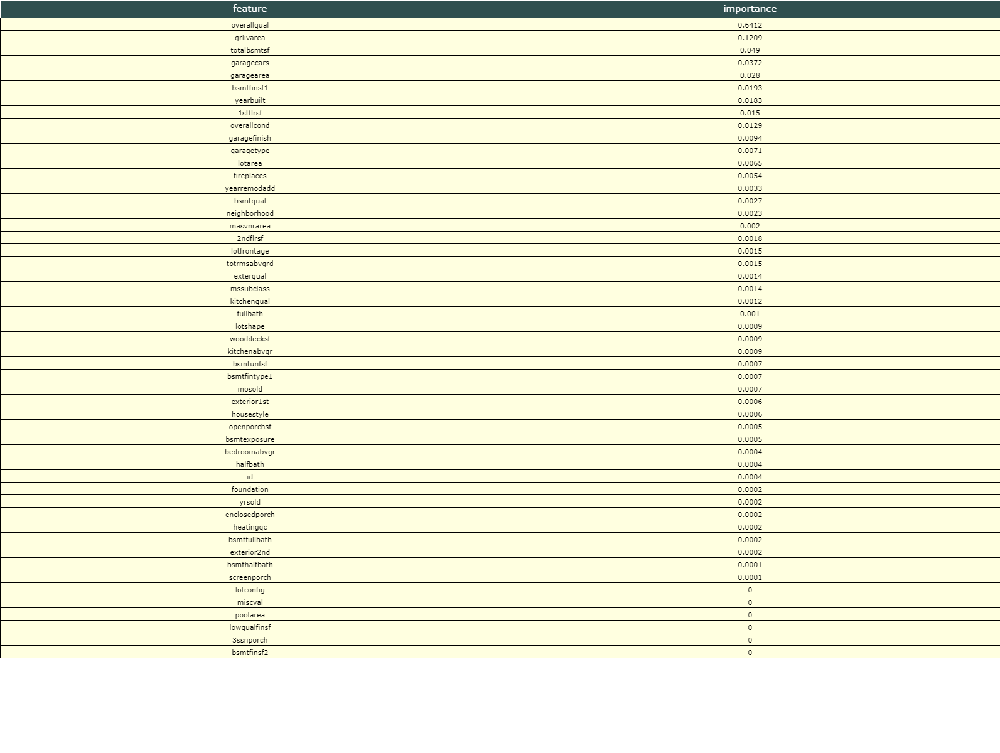


There are 6 features with 0.0 importance
Adding all the features in the top 80% importance layer


In [158]:
RF_feature_importance(X_train, Y_train)

In [160]:
# xg = XGBRegressor(silent=True)
# xg_model = xg.fit(X_train,Y_train)
# xg_coeff = pd.DataFrame(np.round(xg_model.feature_importances_,4)).abs()
# df_xgb = pd.concat([pd.DataFrame(X.columns), xg_coeff], axis=1)
# df_xgb.columns = ['Features','Importance']
# df_xgb = df_xgb.sort_values(by = 'Importance', ascending = False).reset_index(drop=True)
# display(df_xgb[['Features','Importance']].head(15).round(4))

# feature_importances[feature_importances['importance'] <= pp]['feature']

# selected_features_dict.update({"XGB": df_xgb.Features.tolist()[:feature_count]})

## Random Forest Classifier

In [143]:
# rf = RandomForestRegressor()
# rf_model = rf.fit(X_train,Y_train)
# rf_coeff = pd.DataFrame(np.round(rf_model.feature_importances_,4)).abs()
# df_rf = pd.concat([pd.DataFrame(X.columns), rf_coeff], axis=1)
# df_rf.columns = ['Features','Importance']
# df_rf = df_rf.sort_values(by = 'Importance', ascending = False).reset_index(drop=True)
# display(df_rf[['Features','Importance']].head(15).round(4))

,Features,Importance
0,overallqual,0.5507
1,grlivarea,0.1011
2,garagearea,0.0519
3,totalbsmtsf,0.0482
4,garagecars,0.0313
5,bsmtfinsf1,0.0269
6,1stflrsf,0.0248
7,yearbuilt,0.0197
8,overallcond,0.0177
9,lotarea,0.0154


## Final feature list

In [163]:
final_feat = list(set(selected_features_dict['LGBM']).intersection(set(selected_features_dict['XGB'])).intersection(set(selected_features_dict['RF'])))
len(final_feat)

31

In [164]:
print(colored("\nFinal feature list:", 'magenta', attrs = ['bold']), ' || '.join(final_feat))


Final feature list: bsmtexposure || yearremodadd || fireplaces || fullbath || housestyle || totalbsmtsf || garagecars || 2ndflrsf || lotarea || openporchsf || yearbuilt || halfbath || overallqual || overallcond || neighborhood || grlivarea || id || bsmtfintype1 || bedroomabvgr || bsmtfinsf1 || 1stflrsf || kitchenabvgr || garagefinish || wooddecksf || garagearea || lotshape || masvnrarea || totrmsabvgrd || exterior1st || lotfrontage || bsmtunfsf


# Visual Representation

##### Post getting the list of final featres which seem to be important provided the response variable, we can manually plot and check potential patterns of each of the independent feature with the response variable

In [165]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
m=1
for i in feature_final:
    plt.figure(m+1)
    m+=1
    sns.histplot(binwidth=0.5, x=i, hue="persistency_flag", data=data, stat="percent", multiple="dodge", legend = True)

NameError: name 'feature_final' is not defined

# Modelling

### UDFs to make iterative function calls easier and reusability possible

In [173]:
from lightgbm import LGBMRegressor

def LGBM_regressor(X_train, Y_train):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    # feature_importances = np.zeros(X.shape[1])

    # Create the model with several hyperparameters
    model_LGBM = LGBMRegressor(objective='regression')
    params_LGBM = {
                  'num_leaves':[3,4],
                  'learning_rate':[0.01,0.05], 
                  'n_estimators':[750,1000,1250],
                  'max_bin':[70,75,80]
                  # 'bagging_fraction':[0.7,0.8,0.85],
                  # 'bagging_freq':[8,9,10]
            }
    
    # Fit the model multiple times to avoid overfitting - Using GridSearchCV method

    grid_LGBM = GridSearchCV(estimator=model_LGBM, param_grid = params_LGBM, cv = 2, n_jobs=-1)
    grid_LGBM.fit(X_train, Y_train)

    print(" Results from Grid Search " )
    print("\n The best estimator across ALL searched params:\n",grid_LGBM.best_estimator_)
    print("\n The best score across ALL searched params:\n",grid_LGBM.best_score_)
    print("\n The best parameters across ALL searched params:\n",grid_LGBM.best_params_)
    
    LGBM_scores = cross_val_score(grid_LGBM.best_estimator_, X_train, Y_train, scoring="neg_root_mean_squared_error")
    print(LGBM_scores)

In [174]:
LGBM_regressor(X_train[final_feat], Y_train)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1304
[LightGBM] [Info] Number of data points in the train set: 1439, number of used features: 31
[LightGBM] [Info] Start training from score 12.028849
 Results from Grid Search 

 The best estimator across ALL searched params:
 LGBMRegressor(learning_rate=0.05, max_bin=80, n_estimators=750, num_leaves=3,
              objective='regression')

 The best score across ALL searched params:
 0.9118559394164727

 The best parameters across ALL searched params:
 {'learning_rate': 0.05, 'max_bin': 80, 'n_estimators': 750, 'num_leaves': 3}
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1301
[LightGBM] [Info] Number of data points in the train set: 1151, number

In [175]:
def XGB_regressor(X_train, Y_train):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    # feature_importances = np.zeros(X.shape[1])

    # Create the model with several hyperparameters
    model_XGB = XGBRegressor()
    params_XGB = {'learning_rate':[0.15,0.10,0.05],
                      'max_depth':[2,3,4,5],
                      'gamma':[0.0,0.1,0.2,0.3]}
    
    # Fit the model multiple times to avoid overfitting - Using GridSearchCV method

    grid_XGB = GridSearchCV(estimator=model_XGB, param_grid = params_XGB, cv = 2, n_jobs=-1)
    grid_XGB.fit(X_train, Y_train)

    print(" Results from Grid Search " )
    print("\n The best estimator across ALL searched params:\n",grid_XGB.best_estimator_)
    print("\n The best score across ALL searched params:\n",grid_XGB.best_score_)
    print("\n The best parameters across ALL searched params:\n",grid_XGB.best_params_)

    
    XGB_scores = cross_val_score(grid_XGB.best_estimator_, X_train, Y_train, scoring="neg_root_mean_squared_error")
    print(XGB_scores)

In [176]:
XGB_regressor(X_train[final_feat], Y_train)

 Results from Grid Search 

 The best estimator across ALL searched params:
 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

 The best score across ALL searched params:
 0.9013865439387534

 The best parameters across ALL searched params:
 {'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 3}
[-0.11560655 -0.11

In [177]:
def RF_regressor(X_train, Y_train):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    # feature_importances = np.zeros(X.shape[1])

    # Create the model with several hyperparameters
    model_RF = RandomForestRegressor(random_state=0)
    params_RF = {'n_estimators':[100,200,300],
                  'max_depth':[2,3,4,5],
                  'min_samples_split':[3,4,5,6,7],
                  'min_samples_leaf':[1,2,3]}
    
    # Fit the model multiple times to avoid overfitting - Using GridSearchCV method

    grid_RF = GridSearchCV(estimator=model_RF, param_grid = params_RF, cv = 2, n_jobs=-1)
    grid_RF.fit(X_train, Y_train)

    print(" Results from Grid Search " )
    print("\n The best estimator across ALL searched params:\n",grid_RF.best_estimator_)
    print("\n The best score across ALL searched params:\n",grid_RF.best_score_)
    print("\n The best parameters across ALL searched params:\n",grid_RF.best_params_)

    
    RF_scores = cross_val_score(grid_RF.best_estimator_, X_train, Y_train, scoring="neg_root_mean_squared_error")
    print(RF_scores)

In [178]:
RF_regressor(X_train[final_feat], Y_train)

 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestRegressor(max_depth=5, min_samples_split=6, n_estimators=300,
                      random_state=0)

 The best score across ALL searched params:
 0.8559315084078447

 The best parameters across ALL searched params:
 {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 300}
[-0.15104935 -0.1449316  -0.15000507 -0.13801441 -0.14754927]


In [182]:
#Clearly LGBM performed better
from sklearn.metrics import r2_score
final_mod = LGBMRegressor(learning_rate=0.05, max_bin=80, n_estimators=750, num_leaves=3,
              objective='regression')
final_mod.fit(X_train[final_feat],Y_train)

# print("Test set RMSE:", mean_squared_error(y_test, linreg.predict(X_train), squared=False))
# print("Mean validation RMSE:", -linscores["test_score"].mean())

print('The accuracy of the Linear Regression is',r2_score(Y_train,final_mod.predict(X_train[final_feat])))
print ('RMSE is: \n', mean_squared_error(Y_train, final_mod.predict(X_train[final_feat])))

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1304
[LightGBM] [Info] Number of data points in the train set: 1439, number of used features: 31
[LightGBM] [Info] Start training from score 12.028849
The accuracy of the Linear Regression is 0.9500030972500263
RMSE is: 
 0.007511424567405076


In [ ]:
def fit_function(model_name, x_train, y_train):
    if model_name == 'XGB':
        params = {'learning_rate':[0.15,0.10,0.05],
                  'max_depth':[2,3,4,5],
                  'gamma':[0.0,0.1,0.2,0.3]}
        classifier = XGBClassifier()
        random_search = RandomizedSearchCV(classifier, param_distributions = params, cv=3, n_iter = 5, scoring = 'roc_auc', verbose = 3)
        
        model_opt = random_search.fit(x_train, y_train)
        opt_params = model_opt.best_params_
        classifier = classifier.set_params(**opt_params)
        model = classifier.fit(x_train, y_train)
        y_prob_train = model.predict_proba(x_train)
        cv = cross_val_score(classifier, x_train, y_train, cv=3, scoring = 'f1_macro')
    if model_name == 'RF':
        params = {'n_estimators':[100,200,300],
                  'max_depth':[2,3,4,5],
                  'min_samples_split':[3,4,5,6,7],
                  'min_samples_leaf':[1,2,3]}
        classifier = RandomForestClassifier()
        random_search = RandomizedSearchCV(classifier, param_distributions = params, cv=3, n_iter = 5, scoring = 'roc_auc', verbose = 3)
        
        model_opt = random_search.fit(x_train, y_train)
        opt_params = model_opt.best_params_
        classifier = classifier.set_params(**opt_params)
        model = classifier.fit(x_train, y_train)
        y_prob_train = model.predict_proba(x_train)
        cv = cross_val_score(classifier, x_train, y_train, cv=3, scoring = 'f1_macro')
    return model, y_prob_train, cv

In [ ]:
def Opt_thres(target, predicted, p, r, threshold_roc):
    n = min(len(threshold_roc), len(p))
    p=p[0:n]
    r=r[0:n]
    threshold_roc = threshold_roc[0:n]
    i = np.arange(len(1-r))
    roc = pd.DataFrame({'tf':pd.Series(p-r, index=i), 'threshold' : pd.Series(threshold_roc, index=i)})
    roc_t = roc.iloc[(roc.tf-0).abs().argsort()[:-1]]

    return list(roc_t['threshold'])

In [ ]:
def classification_summary(y_train, y_prob, pos_class):
    fpr, tpr, threshold_roc = metrics.roc_curve(y_train,y_prob,pos_label = pos_class)
    threshold_roc[0]=1
    roc_auc = metrics.auc(fpr,tpr)
    p,r,thresholds = precision_recall_curve(y_train,y_prob,pos_label = pos_class)
    optimal_threshold = OP(y_train, y_prob, tpr, (1-fpr), threshold_roc)[0]

    return p,r,thresholds,optimal_threshold, fpr, tpr, roc_auc, threshold_roc

In [ ]:
def roc_plot(fpr, tpr):
    if sum(tpr) > sum(fpr):
        roc_auc = metrics.auc(fpr,tpr)
    else:
        roc_auc = metrics.auc(tpr,fpr)
    roc_fig = go.Figure()
    roc_fig.add_trace(go.Scatter(x=fpr,y=tpr,mode = 'lines', line = dict(color='navy',width=2, dash = 'dash')))
    roc_fig.add_trace(go.Scatter(name = 'AUC - %0.2f' % roc_auc, y=tpr, x=fpr, fill = 'tonexty', mode = 'lines', line_color = 'magenta'))
    roc_fig.update_layout(title = {'text':'ROC', 'y':0.9, 'x':0.5}, width = 900, height = 700)
    roc.update_xaxes(title = '1-Specificity')
    roc.update_yaxes(title = 'Sensitivity')
    roc_fig.show()

## XGBoost Classifier

### Fitting the best model on the training data

In [ ]:
model_name = 'XGB'
model, y_proba_train, cvs = fit_function(model_name, X_train_bal[final_feat], Y_train_bal)

In [ ]:
p,r,thresholds, optimal_threshold, fpr, tpr, roc_auc, threshold_roc = classification_summary(Y_train_bal, y_proba_train[:,0], True)

## ROC Curve

##### More the are under the curve, better the model performance. Since we have less data coverage and even distribution, the model tries its best to capture the available patterns present in the data and so is the inclination towards low accuracy

In [ ]:
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
#XGB Final Results

Y_pred_train = np.where(y_proba_train[:,0] > optimal_threshold, True, False)
optimal_threshold
cm_xgb = confusion_matrix(Y_train_bal, Y_pred_train, labels = [True,False])
tn,fp,fn,tp = confusion_matrix(Y_train_bal, Y_pred_train, labels = [True,False]).ravel()

accuracy_xgb = round(accuracy_score(y_pred = Y_pred_train, y_true = Y_train_bal),2)
precision_xgb = round(precision_score(y_pred = Y_pred_train, y_true = Y_train_bal, pos_label = True),2)
recall_xgb = round(recall_score(y_pred = Y_pred_train, y_true = Y_train_bal, pos_label = True),2)
f1_score_xgb = round(2*precision_xgb*recall_xgb/(precision_xgb+recall_xgb),2)
specificity_xgb = round(tn/(tn+fp),2)

auc = metrics.roc_auc_score(Y_train_bal, Y_pred_train)

## XGBoost Final Results

In [ ]:
display(Markdown(""" <span style="color:darkgreen; font-style:italic; font-size:15px">  <b> Final Results of XGBoost Classifier   </b></span>"""))

print(colored("\nOptimal Threshold:",'magenta', attrs=['bold']),round(optimal_threshold,2))
print(colored("\nConfusion matrix:",'magenta', attrs=['bold']),cm_xgb)
print(colored("\nAccuracy:",'magenta', attrs=['bold']),accuracy_xgb)
print(colored("\Precision:",'magenta', attrs=['bold']),precision_xgb)
print(colored("\Recall:",'magenta', attrs=['bold']),recall_xgb)
print(colored("\nF1 Score:",'magenta', attrs=['bold']),f1_score_xgb)
print(colored("\nArea Under The Curve:",'magenta', attrs=['bold']),round(auc,2))

### Trying Undersampling with RF as previous model accuracy was low

In [ ]:
#Undersampling

from imblearn.under_sampling import NearMiss

label = "US - NM"
NMundersample = NearMiss(version=1, n_neighbors=3)
X_train_bal_RF, Y_train_bal_RF= NMundersample.fit_resample(X_train_VIF, Y_train.astype('boolean'))

In [ ]:
X_RF = X_train_bal_RF
Y_RF = Y_train_bal_RF

RF = RandomForestClassifier()
RF_model = rf.fit(X_RF,Y_RF)
RF_coeff = pd.DataFrame(np.round(RF_model.feature_importances_,4)).abs()
df_RF = pd.concat([pd.DataFrame(X.columns), RF_coeff], axis=1)
df_RF.columns = ['Features','Importance']
df_RF = df_RF.sort_values(by = 'Importance', ascending = False).reset_index(drop=True)
display(df_RF[['Features','Importance']].head(10).round(4))

final_features_RF = df_RF.Features.head(10)

In [ ]:
X_train_bal_RF = X_train_bal_RF[final_features_RF]

model_name = 'XGB'
model_RF, y_proba_train_RF, cvs_RF = fit_function(model_name, X_train_bal_RF, Y_train_bal_RF)

In [ ]:
p_RF,r_RF,thresholds_RF, optimal_threshold_RF, fpr_RF, tpr_RF, roc_auc_RF, threshold_roc_RF = classification_summary(Y_train_bal_RF, y_proba_train_RF[:,0], True)

In [ ]:
plt.plot(fpr_RF,tpr_RF)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
#RF Final Results

Y_pred_train_RF = np.where(y_proba_train_RF[:,0] > optimal_threshold_RF, True, False)
print(optimal_threshold_RF)
cm_RF = confusion_matrix(Y_train_bal_RF, Y_pred_train_RF, labels = [True,False])
tn_RF,fp_RF,fn_RF,tp_RF = confusion_matrix(Y_train_bal_RF, Y_pred_train_RF, labels = [True,False]).ravel()
print(tn_RF,fp_RF,fn_RF,tp_RF)

accuracy_RF = round(accuracy_score(y_pred = Y_pred_train_RF, y_true = Y_train_bal_RF),2)
precision_RF = round(precision_score(y_pred = Y_pred_train_RF, y_true = Y_train_bal_RF, pos_label = True),2)
recall_RF = round(recall_score(y_pred = Y_pred_train_RF, y_true = Y_train_bal_RF, pos_label = True),2)
f1_score_RF = round(2*precision_RF*recall_RF/(precision_RF+recall_RF),2)
specificity_RF = round(tn_RF/(tn_RF+fp_RF),2)

In [ ]:
display(Markdown(""" <span style="color:darkgreen; font-style:italic; font-size:15px">  <b> Final Results of Random Forest Classifier   </b></span>"""))

print(colored("\nOptimal Threshold:",'magenta', attrs=['bold']),round(optimal_threshold_RF,2))
print(colored("\nConfusion matrix:",'magenta', attrs=['bold']),cm_RF)
print(colored("\nAccuracy:",'magenta', attrs=['bold']),accuracy_RF)
print(colored("\Precision:",'magenta', attrs=['bold']),precision_RF)
print(colored("\Recall:",'magenta', attrs=['bold']),recall_RF)
print(colored("\nF1 Score:",'magenta', attrs=['bold']),f1_score_RF)

### Going with XGBoost classifier provided its performance is better

In [ ]:
Y_pred_value = pd.DataFrame(Y_pred_train)
Y_pred_value.columns = ['predicted_persistency_flag']
Y_pred_value.loc[Y_pred_value['predicted_persistency_flag'] == True, 'predicted_persistency_flag'] = 'Persistent'
Y_pred_value.loc[Y_pred_value['predicted_persistency_flag'] == False, 'predicted_persistency_flag'] = 'Non-Persistent'
Y_pred_value.head()

In [ ]:
Y_train_bal.head()

In [ ]:
Y_train_value = pd.DataFrame(Y_train_bal)
Y_train_value = Y_train_value.astype('int64')
Y_train_value.columns = ['actual_persistency_flag']
Y_train_value.loc[Y_train_value['actual_persistency_flag'] == True, 'actual_persistency_flag'] = 'Persistent'
Y_train_value.loc[Y_train_value['actual_persistency_flag'] == False, 'actual_persistency_flag'] = 'Non-Persistent'
Y_train_value.head()

In [ ]:
# X_train_bal.concat(Y_train_bal, axis = 1).concat(predjaj, axis = 1).head()
export_data = pd.concat([X_train_bal,Y_train_value, Y_pred_value], axis=1)

In [ ]:
export_data.to_excel('Final_data.xlsx')